# LSI and LDA Analysis Notebook

UPDATE: While much work has been done to clean up the text there is clearly much more to be done at this point. For instance, the NLTK PorterStemmer seems to not have done as good of a job at stemming the words as we would have liked, and there are still stop words and other characters that carry trivial meaning that are showing up as main factors in some of our topics in both the LSI and LDA models.

UPDATE: We used the SnowballStemmer, but now we are going to try the newly released pynlp from the Stanford NLP group for lemmatization and, hopefully, entity recognition to form better n-grams.

UPDATE: I've added the bigram and trigram preparation to this notebook to keep all of the steps in one place so it can be wholesale moved elsewhere later.

In [24]:
import os
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk import bigrams
from nltk import trigrams
from gensim.models import lsimodel
from gensim.models import ldamodel
from gensim import corpora

%matplotlib inline

In [25]:
pd.set_option('display.max_info_columns',200)
pd.set_option('display.max_colwidth',200)
pd.set_option('display.max_rows', 100)
plt.style.use('ggplot')

In [26]:
df = pd.read_csv('data/cleaned_snowball.csv', sep=',', quotechar='"', index_col=0, header=0)
df.head()

,user.description,text,topic,log_followers,log_retweets,engagement_flag,text_token,text_stemmed,text_processed,positive_emo,outrage_emo,net_emo_outrage
0,"Part of the #VastRightWingConspiracy -- thanks, @HillaryClinton. Better candidate: https://www.randpaul.com/ Retweeting not endorsement. Image: TV lover.","#BanTheBox means ""all is #forgiven""/NO MORE federal #NCIC checks when buying guns? Please consider it, Mr. President @POTUS. #forgiving",G,5.252273,0.0,0,"[u'#BanTheBox', u'means', u'""', u'all', u'is', u'#forgiven', u'""', u'/', u'NO', u'MORE', u'federal', u'#NCIC', u'checks', u'when', u'buying', u'guns', u'?', u'Please', u'consider', u'it', u',', u'...","[u'#banthebox', u'mean', u'""', u'all', u'is', u'#forgiven', u'""', u'/', u'no', u'more', u'feder', u'#ncic', u'check', u'when', u'buy', u'gun', u'?', u'pleas', u'consid', u'it', u',', u'mr', u'.', ...","#banthebox mean "" all is #forgiven "" / no more feder #ncic check when buy gun ? pleas consid it , mr . presid @potus . #forgiv",0,0,0
1,War Veteran who loves his country. Never forget those who died in 'Benghazi'. 864th Engineer Battalion (Combat) (Heavy),BOYCOTT NOV 4 @ABC @CMAwards &gt; THREAT TO ALL GUN OWNERS - BOYCOTT HIS MUSIC &gt; @TheTimMcGraw GUN CONTROL EXTREMIST https://t.co/xMuE2o7vV7 …,G,9.936148,0.0,0,"[u'BOYCOTT', u'NOV', u'4', u'@ABC', u'@CMAwards', u'>', u'THREAT', u'TO', u'ALL', u'GUN', u'OWNERS', u'-', u'BOYCOTT', u'HIS', u'MUSIC', u'>', u'@TheTimMcGraw', u'GUN', u'CONTROL', u'EXTREMIST', u...","[u'boycott', u'nov', u'4', u'@abc', u'@cmaward', u'>', u'threat', u'to', u'all', u'gun', u'owner', u'-', u'boycott', u'his', u'music', u'>', u'@thetimmcgraw', u'gun', u'control', u'extremist', u'h...",boycott nov 4 @abc @cmaward > threat to all gun owner - boycott his music > @thetimmcgraw gun control extremist https://t.co/xmue2o7vv7,0,0,0
2,"Retired: cowboy,truck driver Served in the USAF, hobbies include Shooting sports and hunt and camp born in Calif.and sadly left in 1984","Savage: This is the Most Corrupt, Degenerate, Criminal Gov’t in American History https://t.co/qW12kzuBWH Take my guns lead first.",G,4.043051,0.0,0,"[u'Savage', u':', u'This', u'is', u'the', u'Most', u'Corrupt', u',', u'Degenerate', u',', u'Criminal', u'Gov', u'', u't', u'in', u'American', u'History', u'https://t.co/qW12kzuBWH', u'Take', u'my'...","[u'savag', u':', u'this', u'is', u'the', u'most', u'corrupt', u',', u'degener', u',', u'crimin', u'gov', u'', u't', u'in', u'american', u'histori', u'https://t.co/qw12kzubwh', u'take', u'my', u'gu...","savag : this is the most corrupt , degener , crimin gov t in american histori https://t.co/qw12kzubwh take my gun lead first .",0,0,0
3,Bartender...Bouncer...Autobody......Gravedigger.....Supermodal......OG.....Playboy.........:)\r\n\r\n\r\nDAM...NICE...GUY...MAFIA DEMOLITION INSTALATION,Guns N' Roses - November Rain https://t.co/w2pHuG0QBa via @YouTube,G,6.107023,0.0,0,"[u'Guns', u'N', u""'"", u'Roses', u'-', u'November', u'Rain', u'https://t.co/w2pHuG0QBa', u'via', u'@YouTube']","[u'gun', u'n', u""'"", u'rose', u'-', u'novemb', u'rain', u'https://t.co/w2phug0qba', u'via', u'@youtub']",gun n ' rose - novemb rain https://t.co/w2phug0qba via @youtub,0,0,0
4,Ming doesn't have a trajectory problem.,"I'll say it again: #Tarantino was merely correct. And, to his credit, he's sticking to his rhetorical guns. #BadCops https://t.co/7M4uTpXwyc",G,5.081404,0.0,0,"[u""I'll"", u'say', u'it', u'again', u':', u'#Tarantino', u'was', u'merely', u'correct', u'.', u'And', u',', u'to', u'his', u'credit', u',', u""he's"", u'sticking', u'to', u'his', u'rhetorical', u'gun...","[u""i'll"", u'say', u'it', u'again', u':', u'#tarantino', u'was', u'mere', u'correct', u'.', u'and', u',', u'to', u'his', u'credit', u',', u'he', u'stick', u'to', u'his', u'rhetor', u'gun', u'.', u'...","i'll say it again : #tarantino was mere correct . and , to his credit , he stick to his rhetor gun . #badcop https://t.co/7m4utpxwyc",0,0,0


## What is the breakdown of the tweet distribution

In [27]:
docs = df.text_processed.dropna().tolist()
docs_token = df.text_stemmed.dropna().tolist()
print ("%s gun control tweets, %s gay marriage tweets, and %s climate change tweets" %("{:,}".format(df[df.topic == 'G'].count()[0]), "{:,}".format(df[df.topic == 'M'].count()[0]), "{:,}".format(df[df.topic == 'C'].count()[0])))
print ("%s tweets for LSI" %("{:,}".format(len(docs))))

144,485 gun control tweets, 177,177 gay marriage tweets, and 231,423 climate change tweets
553,086 tweets for LSI


In [28]:
guns_docs = df[df.topic == 'G'].text_processed.dropna().tolist()
climate_docs = df[df.topic == 'C'].text_processed.dropna().tolist()
marriage_docs = df[df.topic == 'M'].text_processed.dropna().tolist()

### Clean up the text some more

In [29]:
docs[831]

'ridicul :-) https://t.co/btphogh62c'

In [30]:
keep = set(['!','?'])
stop = set(stopwords.words('english'))
remove = set([x for x in list(string.punctuation) if x not in keep])
stop.update(remove)
stop.update(['',' ','  '])
docs = [[d for d in doc.split(" ") if d not in stop] for doc in docs]
guns_docs = [[d for d in doc.split(" ") if d not in stop] for doc in guns_docs]
climate_docs = [[d for d in doc.split(" ") if d not in stop] for doc in climate_docs]
marriage_docs = [[d for d in doc.split(" ") if d not in stop] for doc in marriage_docs]

docs_bigrams = [[' '.join([d[0],d[1]]) for d in bigrams(doc)] for doc in docs]
guns_docs_bigrams = [[' '.join([d[0],d[1]]) for d in bigrams(doc)] for doc in guns_docs]
climate_docs_bigrams = [[' '.join([d[0],d[1]]) for d in bigrams(doc)] for doc in climate_docs]
marriage_docs_bigrams = [[' '.join([d[0],d[1]]) for d in bigrams(doc)] for doc in marriage_docs]

docs_trigrams = [[' '.join([d[0],d[1]]) for d in trigrams(doc)] for doc in docs]
guns_docs_trigrams = [[' '.join([d[0],d[1]]) for d in trigrams(doc)] for doc in guns_docs]
climate_docs_trigrams = [[' '.join([d[0],d[1]]) for d in trigrams(doc)] for doc in climate_docs]
marriage_docs_trigrams = [[' '.join([d[0],d[1]]) for d in trigrams(doc)] for doc in marriage_docs]

In [31]:
docs[831]

['ridicul', ':-)', 'https://t.co/btphogh62c']

## LSI via SciKit-Learn's Truncated SVD

The LSI seems to have done a fair job at finding words that fit into a category, but most categories seem to correspond to the overall subject matter as opposed to finding nuances within a topic.

In [9]:
tvec = TfidfVectorizer(min_df=.0001, max_df=.2, stop_words='english', ngram_range=(1,2))
tvec_weights = tvec.fit_transform([' '.join(d) for d in docs])
tvec_weights

<553086x15669 sparse matrix of type '<type 'numpy.float64'>'
	with 5887628 stored elements in Compressed Sparse Row format>

In [10]:
lsa = TruncatedSVD(random_state=0,n_components=100, n_iter=200)
lsa.fit(tvec_weights)

TruncatedSVD(algorithm='randomized', n_components=100, n_iter=200,
       random_state=0, tol=0.0)

In [11]:
terms = tvec.get_feature_names()

In [12]:
lsa.components_.shape

(100, 15669)

In [13]:
for i, comp in enumerate(lsa.components_):
    comp_terms = zip(terms,comp)
    sort_terms = sorted(comp_terms, key=lambda x: x[1], reverse=True)[:20]
    print ("Concept %d" %(i))
    for t in sort_terms:
        print (t[0])
    print(" ")

Concept 0
global
warm
global warm
wed
climat chang
009f
f0
f0 009f
gun
marriag
0098
009f 0098
climatechang
chang https
warm https
say
new
obama
like
terror
 
Concept 1
009f
f0
f0 009f
wed
0098
009f 0098
0082
0098 0082
0092
009f 0092
0091
wed https
009f 0091
008d
008f
marriag
bride
0082 f0
009f 008f
love
 
Concept 2
mph
wind
weather report
weather
report
report wind
wind speed
gust
mph gust
mph temp
wonderland weather
hydeparkwind
hydeparkwind wonderland
wonderland
speed
wind chill
temp
chill
speed mph
rain
 
Concept 3
009f
f0
f0 009f
warm
global warm
global
0098
009f 0098
warm https
mph
wind
0082
0098 0082
0092
0091
009f 0092
009f 0091
008f
008d
weather report
 
Concept 4
wed
wed https
warm
global warm
global
photo
dress
bride
wed dress
day
wed photo
wed day
love
beauti
warm https
mayo360group
mayo360group new
ring
invit
bridal
 
Concept 5
climat chang
chang https
climatechang
wed
threat
world
sander
terror
berni
exxon
gate
climatechang https
pari
say
save climat
save
caus
cop21
social

In [14]:
terms = tvec.get_feature_names()
K = lsa.components_.shape[0]
lsi_sk = pd.DataFrame(lsa.components_.T, index=terms, columns=range(K))
lsi_sk.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
00,0.001029,0.000423,0.000777,-0.001198,0.000826,0.000306,-7.967050e-05,0.000791,-0.000178,-0.000019,...,-0.000479,0.002849,0.000747,0.001004,0.002250,0.000767,0.000735,0.000861,0.001069,-0.000883
00 cst,0.000094,-0.000022,0.000358,0.000005,-0.000017,0.000035,-1.542435e-07,0.000061,-0.000012,0.000042,...,-0.000627,0.000951,0.000097,-0.000023,0.001142,-0.000083,0.000728,-0.000141,0.000928,-0.000336
00 pm,0.000195,0.000080,0.000248,-0.000209,0.000187,0.000063,3.835726e-05,0.000181,-0.000044,-0.000026,...,-0.000671,0.000699,-0.000025,0.000311,0.000635,0.000284,-0.000046,0.000137,0.000545,-0.000256
000,0.007813,-0.000278,0.000766,-0.006781,-0.001593,-0.003277,2.407169e-03,0.001943,-0.001301,0.004222,...,-0.003970,-0.010245,0.002126,0.006409,-0.000305,-0.004880,0.008820,0.001858,0.008050,-0.005146
000 000,0.000579,0.000086,0.000065,-0.000665,-0.000428,-0.000508,1.429874e-03,0.000039,-0.000088,0.000694,...,-0.000739,-0.003423,0.000823,0.000235,0.001127,-0.001738,0.001772,0.001008,0.002469,-0.000550


In [15]:
np.min(lsa.components_), np.max(lsa.components_)

(-0.53860982293153836, 0.83521267220758444)

In [16]:
'''for i in range(K):
    if i == 0:
        fig = plt.figure(figsize=(15,6))
        ax = fig.add_subplot(111)
        ax.grid(False)
        
        mat = [x for x in reversed(np.arange(-0.85,0.85,0.05))]
        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=-0.85, vmax=0.85, cmap=plt.cm.RdYlBu)
        ax.set_xticklabels(['{0:.2f}'.format(x) for x in mat], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.xticks(np.arange(0, len(mat), 1.0))
        plt.title('Top 20 Words per Topic by Word Probabilities - LSI', y=3, fontsize=20)
        
    fig = plt.figure(figsize=(15,1))
    ax = fig.add_subplot(111)
    ax.grid(False)
    
    if np.sum(lsi_sk[i].values) != 0:
        mat = pd.DataFrame(lsi_sk[i][lsi_sk[i] > 0]).sort_values(by=i, ascending=False)
        ax.matshow(np.array(zip([0]*len(mat.values),list(mat.values))).T, vmin=-0.85, vmax=0.85, cmap=plt.cm.RdYlBu)
        ax.set_xticks(np.arange(0, len(mat.values), 1.0))
        ax.set_xticklabels([mat.index.values[x] + "\n"'{0:.3f}'.format(float(mat.values[x])) for x in range(len(mat.values))], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.title('Topic '+str(i), y=4, fontsizeize=14)
    
plt.show()'''

'for i in range(K):\n    if i == 0:\n        fig = plt.figure(figsize=(15,6))\n        ax = fig.add_subplot(111)\n        ax.grid(False)\n        \n        mat = [x for x in reversed(np.arange(-0.85,0.85,0.05))]\n        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=-0.85, vmax=0.85, cmap=plt.cm.RdYlBu)\n        ax.set_xticklabels([\'{0:.2f}\'.format(x) for x in mat], rotation=45)\n        for tick in ax.xaxis.get_majorticklabels():\n            tick.set_horizontalalignment(\'left\')\n        ax.set_ylim(0.5,1)\n        ax.set_yticks([])\n        ax.set_yticklabels([])\n        plt.xticks(np.arange(0, len(mat), 1.0))\n        plt.title(\'Top 20 Words per Topic by Word Probabilities - LSI\', y=3, fontsize=20)\n        \n    fig = plt.figure(figsize=(15,1))\n    ax = fig.add_subplot(111)\n    ax.grid(False)\n    \n    if np.sum(lsi_sk[i].values) != 0:\n        mat = pd.DataFrame(lsi_sk[i][lsi_sk[i] > 0]).sort_values(by=i, ascending=False)\n        ax.matshow(np.array(zip([0]*len(mat

## Prepare the dictionaries and topic corpuses

The LSI model did not produce any useful topics unfortunately.

In [32]:
# UNIGRAMS
# turn our tokenized documents into a id <-> term dictionary
overall_dictionary = corpora.Dictionary(docs)
guns_dictionary = corpora.Dictionary(guns_docs)
climate_dictionary = corpora.Dictionary(climate_docs)
marriage_dictionary = corpora.Dictionary(marriage_docs)
# convert tokenized documents into a document-term matrix
overall_corpus = [overall_dictionary.doc2bow(doc) for doc in docs]
guns_corpus = [guns_dictionary.doc2bow(doc) for doc in guns_docs]
climate_corpus = [climate_dictionary.doc2bow(doc) for doc in climate_docs]
marriage_corpus = [marriage_dictionary.doc2bow(doc) for doc in marriage_docs]

# BIGRAMS
# turn our tokenized documents into a id <-> term dictionary
overall_bigrams_dictionary = corpora.Dictionary(docs_bigrams)
guns_bigrams_dictionary = corpora.Dictionary(guns_docs_bigrams)
climate_bigrams_dictionary = corpora.Dictionary(climate_docs_bigrams)
marriage_bigrams_dictionary = corpora.Dictionary(marriage_docs_bigrams)
# convert tokenized documents into a document-term matrix
overall_bigrams_corpus = [overall_bigrams_dictionary.doc2bow(doc) for doc in docs_bigrams]
guns_bigrams_corpus = [guns_bigrams_dictionary.doc2bow(doc) for doc in guns_docs_bigrams]
climate_bigrams_corpus = [climate_bigrams_dictionary.doc2bow(doc) for doc in climate_docs_bigrams]
marriage_bigrams_corpus = [marriage_bigrams_dictionary.doc2bow(doc) for doc in marriage_docs_bigrams]

# TRIGRAMS
# turn our tokenized documents into a id <-> term dictionary
overall_trigrams_dictionary = corpora.Dictionary(docs_trigrams)
guns_trigrams_dictionary = corpora.Dictionary(guns_docs_trigrams)
climate_trigrams_dictionary = corpora.Dictionary(climate_docs_trigrams)
marriage_trigrams_dictionary = corpora.Dictionary(marriage_docs_trigrams)
# convert tokenized documents into a document-term matrix
overall_trigrams_corpus = [overall_trigrams_dictionary.doc2bow(doc) for doc in docs_trigrams]
guns_trigrams_corpus = [guns_trigrams_dictionary.doc2bow(doc) for doc in guns_docs_trigrams]
climate_trigrams_corpus = [climate_trigrams_dictionary.doc2bow(doc) for doc in climate_docs_trigrams]
marriage_trigrams_corpus = [marriage_trigrams_dictionary.doc2bow(doc) for doc in marriage_docs_trigrams]

## LSI via the Gensim Library

In [18]:
lsi = lsimodel.LsiModel(overall_corpus, id2word=overall_dictionary, num_topics=100  )

In [19]:
K = lsi.num_topics
overall_topicWordProbMat = lsi.print_topics(K, num_words=20)
prob_mat_lsi = dict()
for line in overall_topicWordProbMat:
    topic, words = line
    probs = words.split(" + ")
    for pr in probs:
        word_pr = pr.strip().split("*")
        try:
            prob_mat_lsi[word_pr[1][1:-1]][topic] = float(word_pr[0])
        except:
            prob_mat_lsi[word_pr[1][1:-1]] = [0.0]*K
            prob_mat_lsi[word_pr[1][1:-1]][topic] = float(word_pr[0])
for k in prob_mat_lsi.keys():
    s = np.sum(prob_mat_lsi[k])
    prob_mat_lsi[k].append(s)

In [20]:
lsi.get_topics().shape, len(lsi.show_topics())

((100, 627286), 100)

In [21]:
K_lsi = lsi.num_topics
topicWordProbMat_lsi = lsi.show_topics(K_lsi, num_words=20)
prob_mat_lsi = dict()

for line in topicWordProbMat_lsi:
    topic, words = line
    probs = words.split(" + ")
    for pr in probs:
        word_pr = pr.strip().split("*")
        try:
            prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
        except:
            prob_mat_lsi[word_pr[1][1:-1]] = [0.0]*K_lsi
            prob_mat_lsi[word_pr[1][1:-1]][topic] = float(word_pr[0])
for k in prob_mat_lsi.keys():
    s = np.sum(prob_mat_lsi[k])
    prob_mat_lsi[k].append(s)

df_viz_lsi = pd.DataFrame.from_dict(prob_mat_lsi, orient='index')
df_viz_lsi.rename(columns={50: 'sum'}, inplace=True)
df_viz_lsi = df_viz_lsi.sort_values(by=['sum'], ascending=False)
df_viz_lsi.head(20)

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
control,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.136
direct,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.091
#wed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.095
<u+008e>,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.074
<u+272a>,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.055,0.055
iran-contra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.103
link,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.144
<u+0087>,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,0.101
sofia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.182,0.0,0.0,0.000,0.000,0.000,0.182
pari,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.000,0.000,-0.097


In [22]:
np.min(df_viz_lsi.iloc[:,:50].values), np.max(df_viz_lsi.iloc[:,:50].values)

(-0.46200000000000002, 0.64700000000000002)

In [23]:
'''for i in range(K_lsi):
    if i == 0:
        fig = plt.figure(figsize=(15,6))
        ax = fig.add_subplot(111)
        ax.grid(False)
        
        mat = [x for x in reversed(np.arange(-0.5,0.65,0.05))]
        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=-0.65, vmax=0.65, cmap=plt.cm.RdYlBu)
        ax.set_xticklabels(['{0:.2f}'.format(x) for x in mat], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.xticks(np.arange(0, len(mat), 1.0))
        plt.title('Top 20 Words per Topic by Word Probabilities', y=3, fontsize=20)
        
    fig = plt.figure(figsize=(15,1))
    ax = fig.add_subplot(111)
    ax.grid(False)
    
    if np.sum(df_viz_lsi[i].values) != 0:
        mat = pd.DataFrame(df_viz_lsi[i][df_viz_lsi[i] > 0]).sort_values(by=i, ascending=False)
        ax.matshow(np.array(zip([0]*len(mat.values),list(mat.values))).T, vmin=-0.5, vmax=0.65, cmap=plt.cm.RdYlBu)
        ax.set_xticks(np.arange(0, len(mat.values), 1.0))
        ax.set_xticklabels([mat.index.values[x] + "\n"'{0:.3f}'.format(float(mat.values[x])) for x in range(len(mat.values))], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
    
plt.show()'''

'for i in range(K_lsi):\n    if i == 0:\n        fig = plt.figure(figsize=(15,6))\n        ax = fig.add_subplot(111)\n        ax.grid(False)\n        \n        mat = [x for x in reversed(np.arange(-0.5,0.65,0.05))]\n        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=-0.65, vmax=0.65, cmap=plt.cm.RdYlBu)\n        ax.set_xticklabels([\'{0:.2f}\'.format(x) for x in mat], rotation=45)\n        for tick in ax.xaxis.get_majorticklabels():\n            tick.set_horizontalalignment(\'left\')\n        ax.set_ylim(0.5,1)\n        ax.set_yticks([])\n        ax.set_yticklabels([])\n        plt.xticks(np.arange(0, len(mat), 1.0))\n        plt.title(\'Top 20 Words per Topic by Word Probabilities\', y=3, fontsize=20)\n        \n    fig = plt.figure(figsize=(15,1))\n    ax = fig.add_subplot(111)\n    ax.grid(False)\n    \n    if np.sum(df_viz_lsi[i].values) != 0:\n        mat = pd.DataFrame(df_viz_lsi[i][df_viz_lsi[i] > 0]).sort_values(by=i, ascending=False)\n        ax.matshow(np.array(zip([0

## Overall LDA Model via Gensim

In [24]:
overall_ldamodel = ldamodel.LdaModel(overall_corpus, num_topics=100, id2word=overall_dictionary, iterations=200, random_state=10)
print (overall_ldamodel)

LdaModel(num_terms=627286, num_topics=100, decay=0.5, chunksize=2000)


In [25]:
K = overall_ldamodel.num_topics
overall_topicWordProbMat = overall_ldamodel.print_topics(K, num_words=20)
overall_prob_mat = dict()

for line in overall_topicWordProbMat:
    topic, words = line
    probs = words.split(" + ")
    for pr in probs:
        word_pr = pr.strip().split("*")
        try:
            overall_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
        except:
            overall_prob_mat[word_pr[1][1:-1]] = [0.0]*K
            overall_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
for k in overall_prob_mat.keys():
    s = np.sum(overall_prob_mat[k])
    overall_prob_mat[k].append(s)

In [26]:
df_viz_overall = pd.DataFrame.from_dict(overall_prob_mat, orient='index')
df_viz_overall.rename(columns={100: 'sum'}, inplace=True)
df_viz_overall = df_viz_overall.sort_values(by=['sum'], ascending=False)
df_viz_overall.head(20)

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,sum
!,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.684
?,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.669
via,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.625
#climatechang,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.616
global,0.0,0.599,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.599
...,0.0,0.027,0.0,0.0,0.0,0.007,0.0,0.041,0.024,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.009,0.595
warm,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.490
climat,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.441,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.441
say,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.438
weather,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.430


In [27]:
np.min(df_viz_overall.iloc[:,:100].values), np.max(df_viz_overall.iloc[:,:100].values)

(0.0, 0.68400000000000005)

//anaconda/envs/py27/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


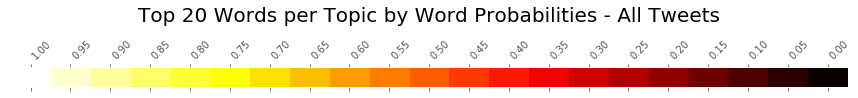

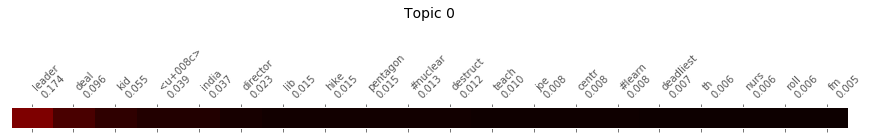

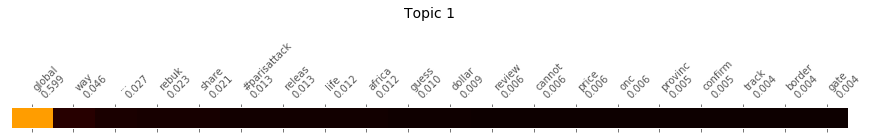

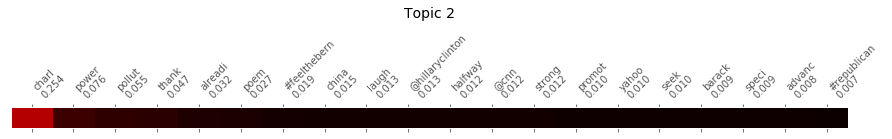

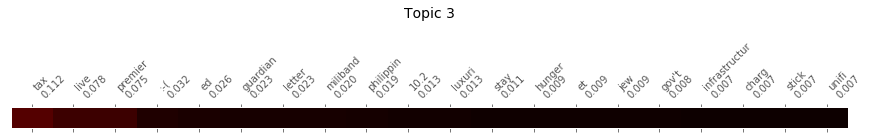

...

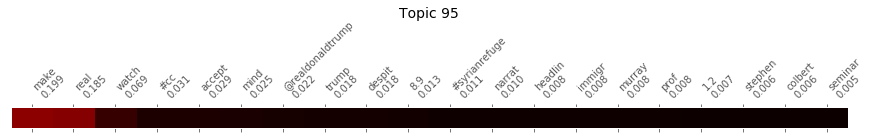

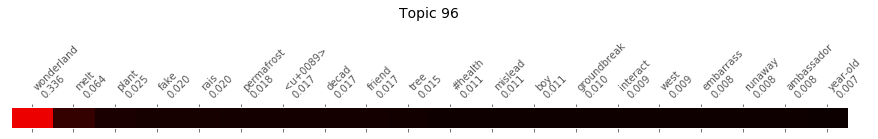

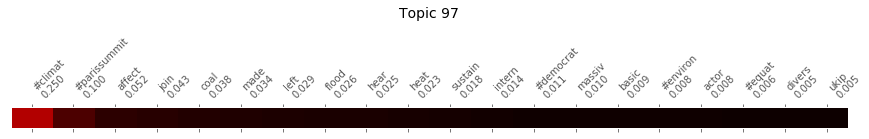

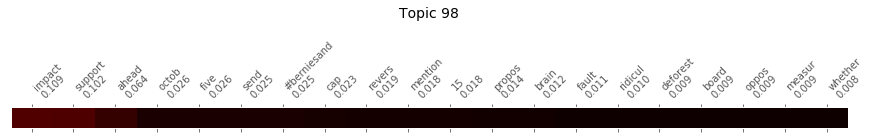

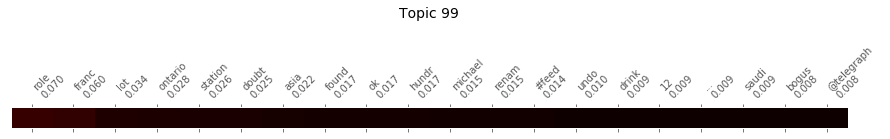

In [28]:
for i in range(K):
    if i == 0:
        fig = plt.figure(figsize=(15,6))
        ax = fig.add_subplot(111)
        ax.grid(False)
        
        mat = [x for x in reversed(np.arange(0.0,1.05,0.05))]
        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=0., vmax=1., cmap=plt.cm.hot)
        ax.set_xticklabels(['{0:.2f}'.format(x) for x in mat], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.xticks(np.arange(0, len(mat), 1.0))
        plt.title('Top 20 Words per Topic by Word Probabilities - All Tweets', y=3, fontsize=20)
        
    fig = plt.figure(figsize=(15,1))
    ax = fig.add_subplot(111)
    ax.grid(False)
    
    mat = pd.DataFrame(df_viz_overall[i][df_viz_overall[i] > 0]).sort_values(by=i, ascending=False)
    ax.matshow(np.array(zip([0]*len(mat.values),list(mat.values))).T, vmin=0., vmax=1., cmap=plt.cm.hot)
    ax.set_xticks(np.arange(0, len(mat.values), 1.0))
    ax.set_xticklabels([mat.index.values[x] + "\n"'{0:.3f}'.format(float(mat.values[x])) for x in range(len(mat.values))], rotation=45)
    for tick in ax.xaxis.get_majorticklabels():
        tick.set_horizontalalignment('left')
    ax.set_ylim(0.5,1)
    ax.set_yticks([])
    ax.set_yticklabels([])
    plt.title('Topic '+str(i), y=5, fontsize=14)

plt.savefig("all_tweets_topics.png")    
plt.show()

## Guns LDA Model

In [29]:
guns_ldamodel = ldamodel.LdaModel(guns_corpus, num_topics=100, id2word=guns_dictionary, iterations=200, random_state=10)
print (guns_ldamodel)

LdaModel(num_terms=171377, num_topics=100, decay=0.5, chunksize=2000)


In [30]:
K = guns_ldamodel.num_topics
guns_topicWordProbMat = guns_ldamodel.print_topics(K, num_words=20)
guns_prob_mat = dict()

for line in guns_topicWordProbMat:
    topic, words = line
    probs = words.split(" + ")
    for pr in probs:
        word_pr = pr.strip().split("*")
        try:
            guns_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
        except:
            guns_prob_mat[word_pr[1][1:-1]] = [0.0]*K
            guns_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
for k in guns_prob_mat.keys():
    s = np.sum(guns_prob_mat[k])
    guns_prob_mat[k].append(s)

In [31]:
df_viz_guns = pd.DataFrame.from_dict(guns_prob_mat, orient='index')
df_viz_guns.rename(columns={100: 'sum'}, inplace=True)
df_viz_guns = df_viz_guns.sort_values(by=['sum'], ascending=False)
df_viz_guns.head(20)

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,sum
gun,0.025,0.034,0.019,0.037,0.094,0.100,0.027,0.043,0.037,0.087,...,0.024,0.012,0.033,0.017,0.0,0.022,0.008,0.036,0.071,4.618
...,0.048,0.015,0.000,0.000,0.000,0.021,0.000,0.000,0.025,0.000,...,0.000,0.000,0.000,0.000,0.0,0.034,0.000,0.000,0.000,0.652
!,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.651,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.651
via,0.047,0.000,0.000,0.000,0.000,0.011,0.000,0.013,0.000,0.022,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.018,0.014,0.548
?,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.519
control,0.025,0.000,0.000,0.000,0.019,0.000,0.000,0.000,0.000,0.035,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.000,0.011,0.471
#2a,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.405
kill,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.360
nra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.319
#nra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.0,0.000,0.125,0.000,0.000,0.319


In [32]:
np.min(df_viz_guns.iloc[:,:100].values), np.max(df_viz_guns.iloc[:,:100].values)

(0.0, 0.65100000000000002)

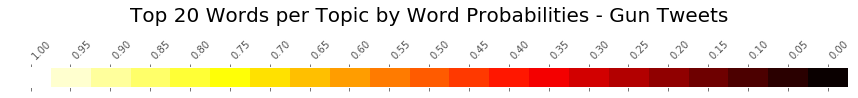

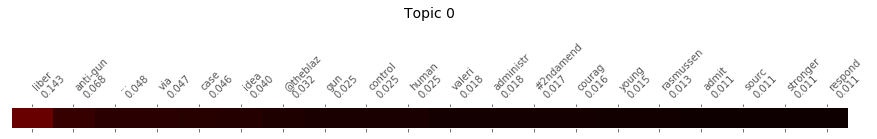

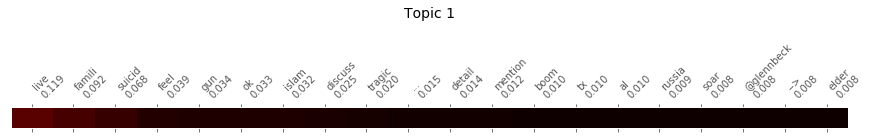

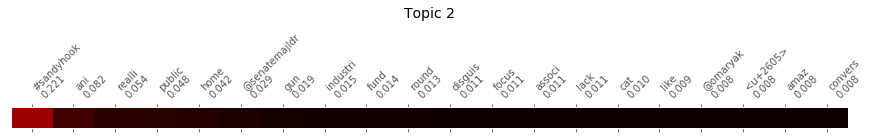

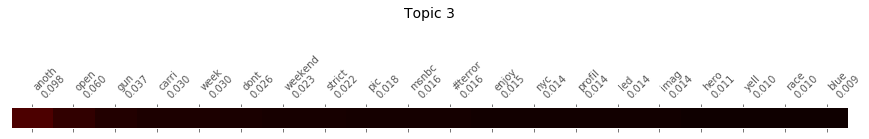

...

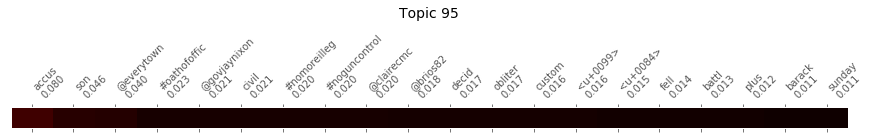

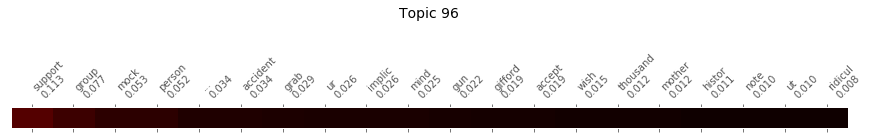

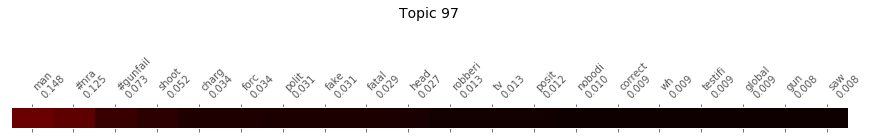

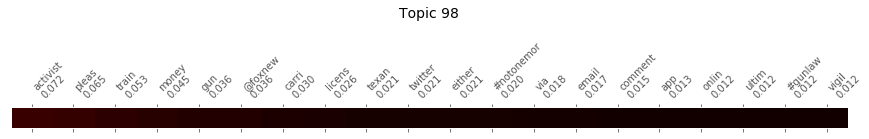

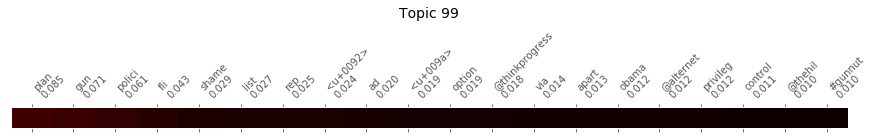

In [33]:
for i in range(K):
    if i == 0:
        fig = plt.figure(figsize=(15,6))
        ax = fig.add_subplot(111)
        ax.grid(False)
        
        mat = [x for x in reversed(np.arange(0.0,1.05,0.05))]
        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=0., vmax=1., cmap=plt.cm.hot)
        ax.set_xticklabels(['{0:.2f}'.format(x) for x in mat], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.xticks(np.arange(0, len(mat), 1.0))
        plt.title('Top 20 Words per Topic by Word Probabilities - Gun Tweets', y=3, fontsize=20)
        
    fig = plt.figure(figsize=(15,1))
    ax = fig.add_subplot(111)
    ax.grid(False)
    
    mat = pd.DataFrame(df_viz_guns[i][df_viz_guns[i] > 0]).sort_values(by=i, ascending=False)
    ax.matshow(np.array(zip([0]*len(mat.values),list(mat.values))).T, vmin=0., vmax=1., cmap=plt.cm.hot)
    ax.set_xticks(np.arange(0, len(mat.values), 1.0))
    ax.set_xticklabels([mat.index.values[x] + "\n"'{0:.3f}'.format(float(mat.values[x])) for x in range(len(mat.values))], rotation=45)
    for tick in ax.xaxis.get_majorticklabels():
        tick.set_horizontalalignment('left')
    ax.set_ylim(0.5,1)
    ax.set_yticks([])
    ax.set_yticklabels([])
    plt.title('Topic '+str(i), y=5, fontsize=14)

plt.savefig("gun_topics.png")    
plt.show()

In [34]:
climate_ldamodel = ldamodel.LdaModel(climate_corpus, num_topics=100, id2word=climate_dictionary, iterations=200, random_state=10)
print (climate_ldamodel)

LdaModel(num_terms=269060, num_topics=100, decay=0.5, chunksize=2000)


In [35]:
K = climate_ldamodel.num_topics
climate_topicWordProbMat = climate_ldamodel.print_topics(K, num_words=20)
climate_prob_mat = dict()

for line in climate_topicWordProbMat:
    topic, words = line
    probs = words.split(" + ")
    for pr in probs:
        word_pr = pr.strip().split("*")
        try:
            climate_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
        except:
            climate_prob_mat[word_pr[1][1:-1]] = [0.0]*K
            climate_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
for k in climate_prob_mat.keys():
    s = np.sum(climate_prob_mat[k])
    climate_prob_mat[k].append(s)

In [36]:
df_viz_climate = pd.DataFrame.from_dict(climate_prob_mat, orient='index')
df_viz_climate.rename(columns={100: 'sum'}, inplace=True)
df_viz_climate = df_viz_climate.sort_values(by=['sum'], ascending=False)
df_viz_climate.head(20)

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,sum
climat,0.0,0.059,0.000,0.010,0.009,0.000,0.000,0.118,0.000,0.055,...,0.000,0.059,0.029,0.011,0.111,0.098,0.084,0.009,0.032,3.519
chang,0.0,0.058,0.000,0.013,0.008,0.000,0.000,0.103,0.000,0.053,...,0.000,0.057,0.029,0.013,0.113,0.102,0.089,0.008,0.011,3.175
#climatechang,0.0,0.015,0.012,0.013,0.000,0.000,0.024,0.000,0.012,0.000,...,0.025,0.000,0.008,0.014,0.000,0.000,0.008,0.017,0.009,1.513
...,0.0,0.007,0.000,0.000,0.000,0.022,0.000,0.011,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.010,0.000,0.666
!,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.639
via,0.0,0.030,0.000,0.000,0.000,0.020,0.000,0.008,0.000,0.015,...,0.000,0.000,0.000,0.000,0.013,0.010,0.000,0.000,0.011,0.588
?,0.0,0.000,0.000,0.000,0.000,0.028,0.034,0.000,0.000,0.000,...,0.000,0.000,0.005,0.000,0.000,0.000,0.000,0.000,0.000,0.579
c,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.529
global,0.0,0.000,0.000,0.000,0.000,0.395,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.395
speed,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.368


In [37]:
np.min(df_viz_climate.iloc[:,:100].values), np.max(df_viz_climate.iloc[:,:100].values)

(0.0, 0.63900000000000001)

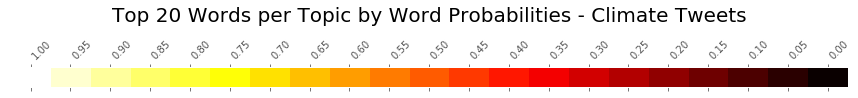

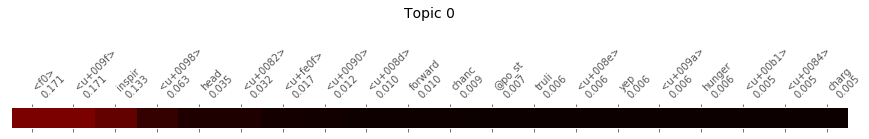

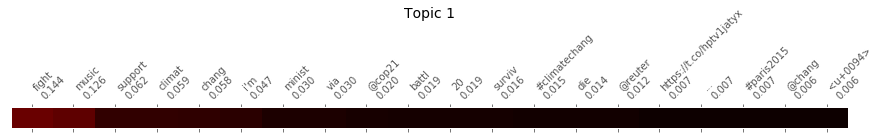

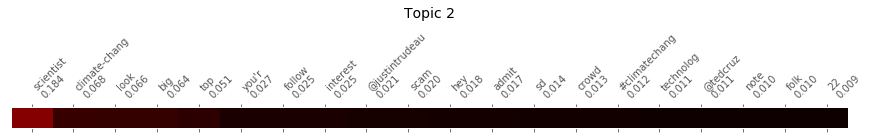

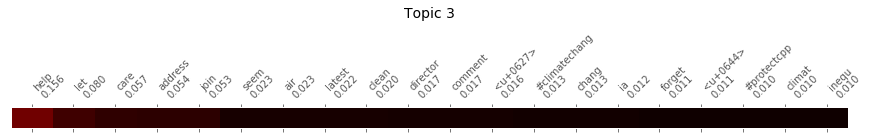

...

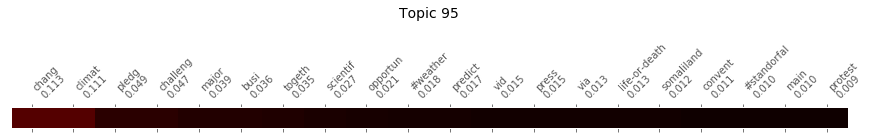

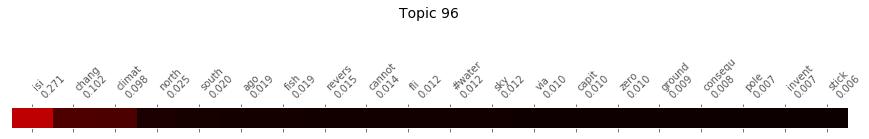

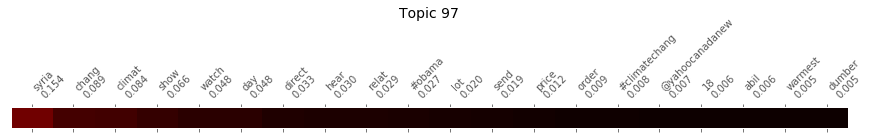

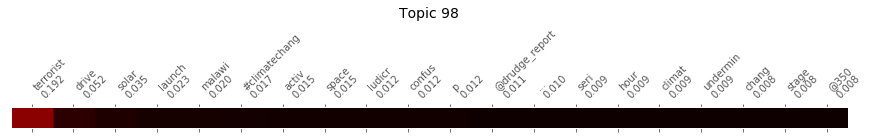

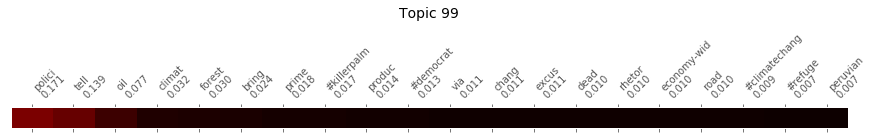

In [38]:
for i in range(K):
    if i == 0:
        fig = plt.figure(figsize=(15,6))
        ax = fig.add_subplot(111)
        ax.grid(False)
        
        mat = [x for x in reversed(np.arange(0.0,1.05,0.05))]
        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=0., vmax=1., cmap=plt.cm.hot)
        ax.set_xticklabels(['{0:.2f}'.format(x) for x in mat], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.xticks(np.arange(0, len(mat), 1.0))
        plt.title('Top 20 Words per Topic by Word Probabilities - Climate Tweets', y=3, fontsize=20)
        
    fig = plt.figure(figsize=(15,1))
    ax = fig.add_subplot(111)
    ax.grid(False)
    
    mat = pd.DataFrame(df_viz_climate[i][df_viz_climate[i] > 0]).sort_values(by=i, ascending=False)
    ax.matshow(np.array(zip([0]*len(mat.values),list(mat.values))).T, vmin=0., vmax=1., cmap=plt.cm.hot)
    ax.set_xticks(np.arange(0, len(mat.values), 1.0))
    ax.set_xticklabels([mat.index.values[x] + "\n"'{0:.3f}'.format(float(mat.values[x])) for x in range(len(mat.values))], rotation=45)
    for tick in ax.xaxis.get_majorticklabels():
        tick.set_horizontalalignment('left')
    ax.set_ylim(0.5,1)
    ax.set_yticks([])
    ax.set_yticklabels([])
    plt.title('Topic '+str(i), y=5, fontsize=14)

plt.savefig("climate_topics.png")
plt.show()

In [39]:
marriage_ldamodel = ldamodel.LdaModel(marriage_corpus, num_topics=100, id2word=marriage_dictionary, iterations=200, random_state=10)
print (marriage_ldamodel)

LdaModel(num_terms=243740, num_topics=100, decay=0.5, chunksize=2000)


In [40]:
K = marriage_ldamodel.num_topics
marriage_topicWordProbMat = marriage_ldamodel.print_topics(K, num_words=20)
marriage_prob_mat = dict()

for line in marriage_topicWordProbMat:
    topic, words = line
    probs = words.split(" + ")
    for pr in probs:
        word_pr = pr.strip().split("*")
        try:
            marriage_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
        except:
            marriage_prob_mat[word_pr[1][1:-1]] = [0.0]*K
            marriage_prob_mat[word_pr[1][1:-1]][topic] = float(word_pr[0])
for k in marriage_prob_mat.keys():
    s = np.sum(marriage_prob_mat[k])
    marriage_prob_mat[k].append(s)

In [41]:
df_viz_marriage = pd.DataFrame.from_dict(marriage_prob_mat, orient='index')
df_viz_marriage.rename(columns={100: 'sum'}, inplace=True)
df_viz_marriage = df_viz_marriage.sort_values(by=['sum'], ascending=False)
df_viz_marriage.head(20)

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,sum
wed,0.070,0.04,0.011,0.000,0.043,0.026,0.000,0.060,0.000,0.085,...,0.000,0.170,0.00,0.000,0.016,0.000,0.0,0.000,0.0,3.096
marriag,0.000,0.00,0.074,0.025,0.000,0.044,0.048,0.000,0.034,0.000,...,0.064,0.000,0.04,0.115,0.015,0.039,0.0,0.121,0.0,2.264
...,0.014,0.00,0.035,0.016,0.000,0.000,0.000,0.000,0.010,0.042,...,0.009,0.046,0.00,0.000,0.000,0.012,0.0,0.033,0.0,1.000
bride,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.011,0.019,0.000,...,0.031,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.587
!,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.584
<u+009f>,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.515
<f0>,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.514
?,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.472
photo,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.391
#wed,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.00,0.000,0.000,0.000,0.0,0.000,0.0,0.388


In [42]:
np.min(df_viz_marriage.iloc[:,:100].values), np.max(df_viz_marriage.iloc[:,:100].values)

(0.0, 0.58399999999999996)

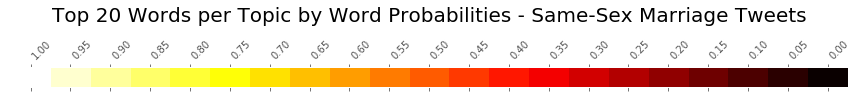

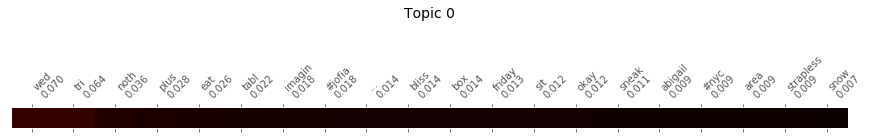

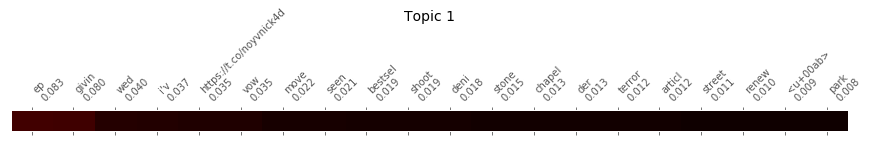

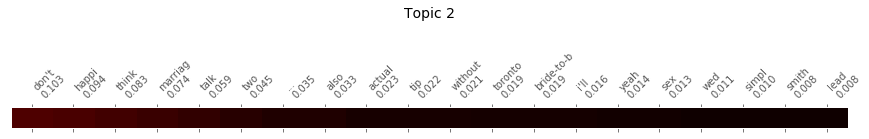

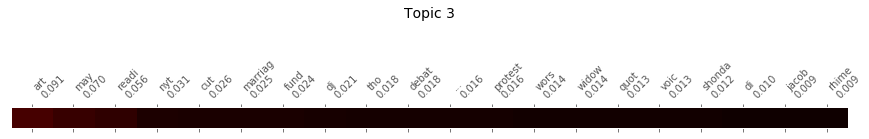

...

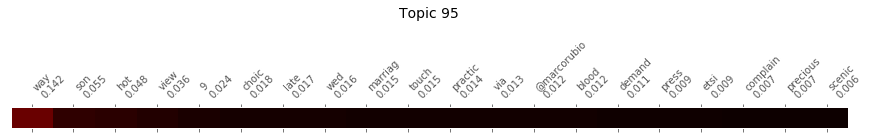

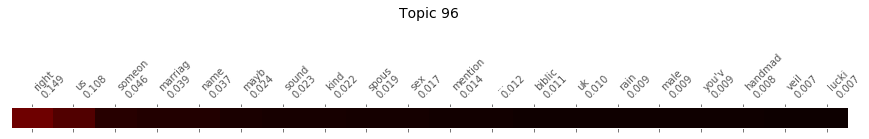

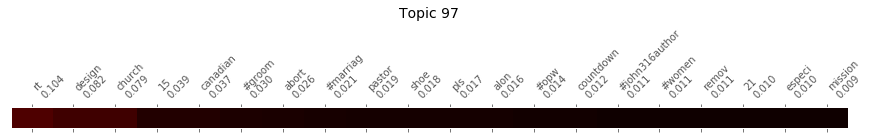

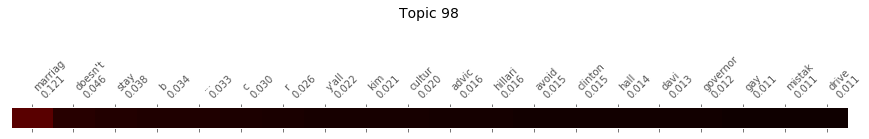

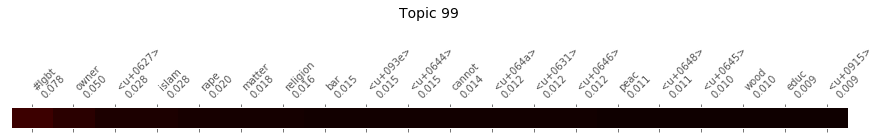

In [43]:
for i in range(K):
    if i == 0:
        fig = plt.figure(figsize=(15,6))
        ax = fig.add_subplot(111)
        ax.grid(False)
        
        mat = [x for x in reversed(np.arange(0.0,1.05,0.05))]
        ax.matshow(np.array(zip([0]*len(mat),mat)).T, vmin=0., vmax=1., cmap=plt.cm.hot)
        ax.set_xticklabels(['{0:.2f}'.format(x) for x in mat], rotation=45)
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment('left')
        ax.set_ylim(0.5,1)
        ax.set_yticks([])
        ax.set_yticklabels([])
        plt.xticks(np.arange(0, len(mat), 1.0))
        plt.title('Top 20 Words per Topic by Word Probabilities - Same-Sex Marriage Tweets', y=3, fontsize=20)
        
    fig = plt.figure(figsize=(15,1))
    ax = fig.add_subplot(111)
    ax.grid(False)
    
    mat = pd.DataFrame(df_viz_marriage[i][df_viz_marriage[i] > 0]).sort_values(by=i, ascending=False)
    ax.matshow(np.array(zip([0]*len(mat.values),list(mat.values))).T, vmin=0., vmax=1., cmap=plt.cm.hot)
    ax.set_xticks(np.arange(0, len(mat.values), 1.0))
    ax.set_xticklabels([mat.index.values[x] + "\n"'{0:.3f}'.format(float(mat.values[x])) for x in range(len(mat.values))], rotation=45)
    for tick in ax.xaxis.get_majorticklabels():
        tick.set_horizontalalignment('left')
    ax.set_ylim(0.5,1)
    ax.set_yticks([])
    ax.set_yticklabels([])
    plt.title('Topic '+str(i), y=5, fontsize=14)

plt.savefig("marriage_topics.png")    
plt.show()

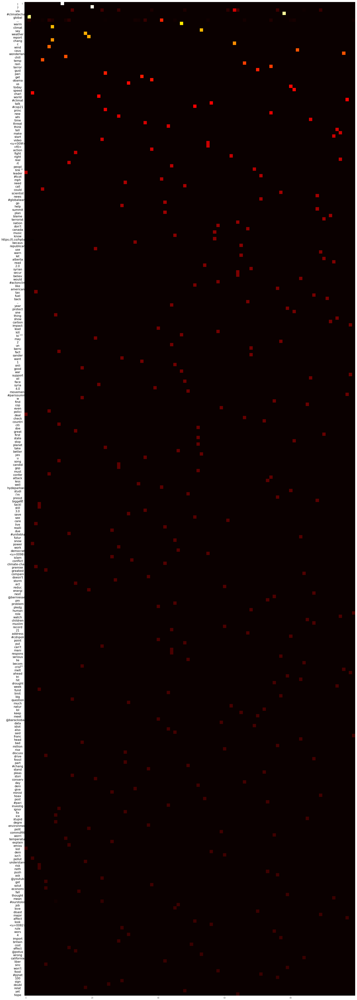

In [44]:
fig = plt.figure(figsize=(100, 100))
ax = fig.add_subplot(111)
ax.grid(False)

for val, key in enumerate(df_viz_overall.index.values[:300]):
    ax.text(-2.5, val + 0.3, key, 
            horizontalalignment='center', verticalalignment='center'
            , fontsize=16)

ax.imshow(df_viz_overall.iloc[:300,:100].values, cmap='hot', interpolation='nearest')
plt.savefig("all_tweets_top_words.png")
plt.show()

## PICKLES!

In [34]:
import pickle

pickle.dump( overall_ldamodel, open( "pickles/overall_ldamodel_100t_200i.p", "wb" ) )
pickle.dump( guns_ldamodel, open( "pickles/guns_ldamodel_100t_200i.p", "wb" ) )
pickle.dump( climate_ldamodel, open( "pickles/climate_ldamodel_100t_200i.p", "wb" ) )
pickle.dump( marriage_ldamodel, open( "pickles/marriage_ldamodel_100t_200i.p", "wb" ) )

In [35]:
pickle.dump( overall_bigrams_dictionary, open( "pickles/overall_bigrams_dictionary.p", "wb" ) )
pickle.dump( guns_bigrams_dictionary, open( "pickles/guns_bigrams_dictionary.p", "wb" ) )
pickle.dump( climate_bigrams_dictionary, open( "pickles/climate_bigrams_dictionary.p", "wb" ) )
pickle.dump( marriage_bigrams_dictionary, open( "pickles/marriage_bigrams_dictionary.p", "wb" ) )

pickle.dump( overall_trigrams_dictionary, open( "pickles/overall_trigrams_dictionary.p", "wb" ) )
pickle.dump( guns_trigrams_dictionary, open( "pickles/guns_trigrams_dictionary.p", "wb" ) )
pickle.dump( climate_trigrams_dictionary, open( "pickles/climate_trigrams_dictionary.p", "wb" ) )
pickle.dump( marriage_trigrams_dictionary, open( "pickles/marriage_trigrams_dictionary.p", "wb" ) )

In [36]:
pickle.dump( overall_bigrams_corpus, open( "pickles/overall_bigrams_corpus.p", "wb" ) )
pickle.dump( guns_bigrams_corpus, open( "pickles/guns_bigrams_corpus.p", "wb" ) )
pickle.dump( climate_bigrams_corpus, open( "pickles/climate_bigrams_corpus.p", "wb" ) )
pickle.dump( marriage_bigrams_corpus, open( "pickles/marriage_bigrams_corpus.p", "wb" ) )

pickle.dump( overall_trigrams_corpus, open( "pickles/overall_trigrams_corpus.p", "wb" ) )
pickle.dump( guns_trigrams_corpus, open( "pickles/guns_trigrams_corpus.p", "wb" ) )
pickle.dump( climate_trigrams_corpus, open( "pickles/climate_trigrams_corpus.p", "wb" ) )
pickle.dump( marriage_trigrams_corpus, open( "pickles/marriage_trigrams_corpus.p", "wb" ) )